In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
from scipy.stats import *

import seaborn as sns
from wordcloud import WordCloud
import mplcyberpunk
import matplotlib.pyplot as plt
%matplotlib inline

pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 1000)
import warnings 

warnings.filterwarnings("ignore")
plt.style.use("cyberpunk")

In [2]:
mpl.rcParams["font.style"] = "italic"
mpl.rcParams["font.weight"] = "bold"
mpl.rcParams["axes.linewidth"] = 1.5
mpl.rcParams["figure.dpi"] = 150
mpl.rcParams["axes.titlesize"] = 20
mpl.rcParams["axes.labelsize"] = 15
mpl.rcParams["axes.titleweight"] = "bold"
mpl.rcParams["axes.titlelocation"] = "left"
mpl.rcParams["axes.spines.top"] = False
mpl.rcParams["axes.spines.right"] = False
mpl.rcParams["axes.labelweight"] = "bold"
mpl.rcParams["axes.labelpad"] = 5
mpl.rcParams["axes.titlepad"] = 20
mpl.rcParams['axes.labelcolor'] = "white"
mpl.rcParams['axes.edgecolor'] = "white"
mpl.rcParams['xtick.labelsize'] = 15
mpl.rcParams['ytick.labelsize'] = 15
mpl.rcParams['xtick.color'] = "white"
mpl.rcParams['ytick.color'] = "white"
mpl.rcParams["boxplot.boxprops.color"] = "white"
mpl.rcParams["boxplot.whiskerprops.color"] = "white"
mpl.rcParams["boxplot.capprops.color"] = "white"
mpl.rcParams["boxplot.flierprops.markerfacecolor"] =  "white"


In [3]:
train = pd.read_csv("/storage/emulated/0/Participants_Data_WSMLC/train.csv") 
test = pd.read_csv("/storage/emulated/0/Participants_Data_WSMLC/test.csv") 

In [4]:
train.head()

,Year,Month,Day,Hour,Minute,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag
0,2009,1,1,0,0,0,0,0,0,0.0,5.0,1010,75.34,106.15,0.499,346.1,3.1,0
1,2009,1,1,0,30,0,0,0,0,1.0,5.0,1010,80.81,112.28,0.490,346.1,3.1,0
2,2009,1,1,1,0,0,0,0,4,0.0,5.0,1010,78.27,118.50,0.482,347.9,3.2,0
3,2009,1,1,1,30,0,0,0,4,0.0,4.0,1010,78.27,124.78,0.478,347.9,3.1,0
4,2009,1,1,2,0,0,0,0,4,0.0,4.0,1010,76.45,131.12,0.475,350.0,3.0,0


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175296 entries, 0 to 175295
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Year                175296 non-null  int64  
 1   Month               175296 non-null  int64  
 2   Day                 175296 non-null  int64  
 3   Hour                175296 non-null  int64  
 4   Minute              175296 non-null  int64  
 5   Clearsky DHI        175296 non-null  int64  
 6   Clearsky DNI        175296 non-null  int64  
 7   Clearsky GHI        175296 non-null  int64  
 8   Cloud Type          175296 non-null  int64  
 9   Dew Point           175296 non-null  float64
 10  Temperature         175296 non-null  float64
 11  Pressure            175296 non-null  int64  
 12  Relative Humidity   175296 non-null  float64
 13  Solar Zenith Angle  175296 non-null  float64
 14  Precipitable Water  175296 non-null  float64
 15  Wind Direction      175296 non-nul

In [12]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17520 entries, 0 to 17519
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Year                17520 non-null  int64  
 1   Month               17520 non-null  int64  
 2   Day                 17520 non-null  int64  
 3   Hour                17520 non-null  int64  
 4   Minute              17520 non-null  int64  
 5   Cloud Type          17520 non-null  int64  
 6   Dew Point           17520 non-null  float64
 7   Temperature         17520 non-null  float64
 8   Pressure            17520 non-null  int64  
 9   Relative Humidity   17520 non-null  float64
 10  Solar Zenith Angle  17520 non-null  float64
 11  Precipitable Water  17520 non-null  float64
 12  Wind Direction      17520 non-null  int64  
 13  Wind Speed          17520 non-null  float64
 14  Fill Flag           17520 non-null  int64  
 15  Clearsky DHI        0 non-null      float64
 16  Clea

In [13]:
test.head()

,Year,Month,Day,Hour,Minute,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag,Clearsky DHI,Clearsky DNI,Clearsky GHI
0,2019,1,1,0,0,7,18.4,18.8,1008,97.70,106.23,3.5,190,2.3,0,NaN,NaN,NaN
1,2019,1,1,0,30,3,18.4,18.6,1008,98.92,112.36,3.5,187,2.5,0,NaN,NaN,NaN
2,2019,1,1,1,0,3,18.2,18.5,1008,98.35,118.58,3.5,184,2.8,0,NaN,NaN,NaN
3,2019,1,1,1,30,3,18.2,18.3,1008,99.58,124.86,3.5,185,3.0,0,NaN,NaN,NaN
4,2019,1,1,2,0,0,18.0,18.0,1008,99.71,131.20,3.6,186,3.1,0,NaN,NaN,NaN


In [16]:
train.head()

,Year,Month,Day,Hour,Minute,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag
0,2009,1,1,0,0,0,0,0,0,0.0,5.0,1010,75.34,106.15,0.499,346.1,3.1,0
1,2009,1,1,0,30,0,0,0,0,1.0,5.0,1010,80.81,112.28,0.490,346.1,3.1,0
2,2009,1,1,1,0,0,0,0,4,0.0,5.0,1010,78.27,118.50,0.482,347.9,3.2,0
3,2009,1,1,1,30,0,0,0,4,0.0,4.0,1010,78.27,124.78,0.478,347.9,3.1,0
4,2009,1,1,2,0,0,0,0,4,0.0,4.0,1010,76.45,131.12,0.475,350.0,3.0,0


In [7]:
#check nan values
pd.DataFrame({"train/null":(train.isnull().sum()/train.shape[0])*100,
              "test/null":(test.isnull().sum()/test.shape[0])*100})
              

,train/null,test/null
Clearsky DHI,0.0,100.0
Clearsky DNI,0.0,100.0
Clearsky GHI,0.0,100.0
Cloud Type,0.0,0.0
Day,0.0,0.0
Dew Point,0.0,0.0
Fill Flag,0.0,0.0
Hour,0.0,0.0
Minute,0.0,0.0
Month,0.0,0.0


In [6]:
train[train.duplicated()] #check duplicated

,Year,Month,Day,Hour,Minute,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag


## EDA

In [ ]:
#target

In [4]:
target = train[["Clearsky DHI","Clearsky DNI","Clearsky GHI"]]

In [5]:
target.describe() 

,Clearsky DHI,Clearsky DNI,Clearsky GHI
count,175296.000000,175296.000000,175296.000000
mean,53.065426,330.065295,254.365490
std,64.201407,370.030821,327.705006
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,103.000000,736.000000,535.000000
max,565.000000,1040.000000,1063.000000


Text(0.5, 1, ' Target')

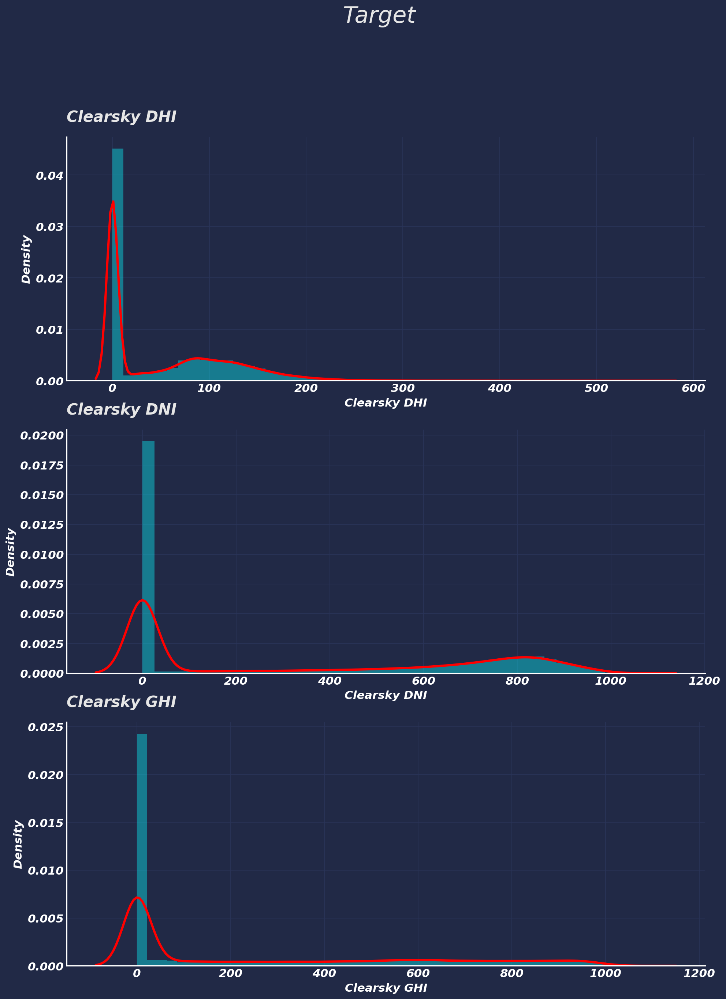

In [8]:
plt.figure(figsize=(15,20))

for i, j in enumerate(target.columns): 
    plt.subplot(3, 1, i+1) 
    
    sns.distplot(train[j], kde_kws={"linewidth": 3,"color": "red"}) 
    plt.title(j) 
plt.suptitle(" Target", size=30, y= 1) 

In [17]:
# check kemiringan dan kurtosis

for i in target.columns:
    print(i)       
    print(f"skew: {train[i].skew() }") 
    print(f"Kurt: {train[i].kurt() }\n") 

Clearsky DHI
skew: 0.9250632056766722
Kurt: 0.052715991397870976

Clearsky DNI
skew: 0.4063797696658915
Kurt: -1.6133825444205192

Clearsky GHI
skew: 0.883321827163834
Kurt: -0.7529019217922461



In [ ]:
# normal kan target dengan log +1

Text(0.5, 1, ' Target')

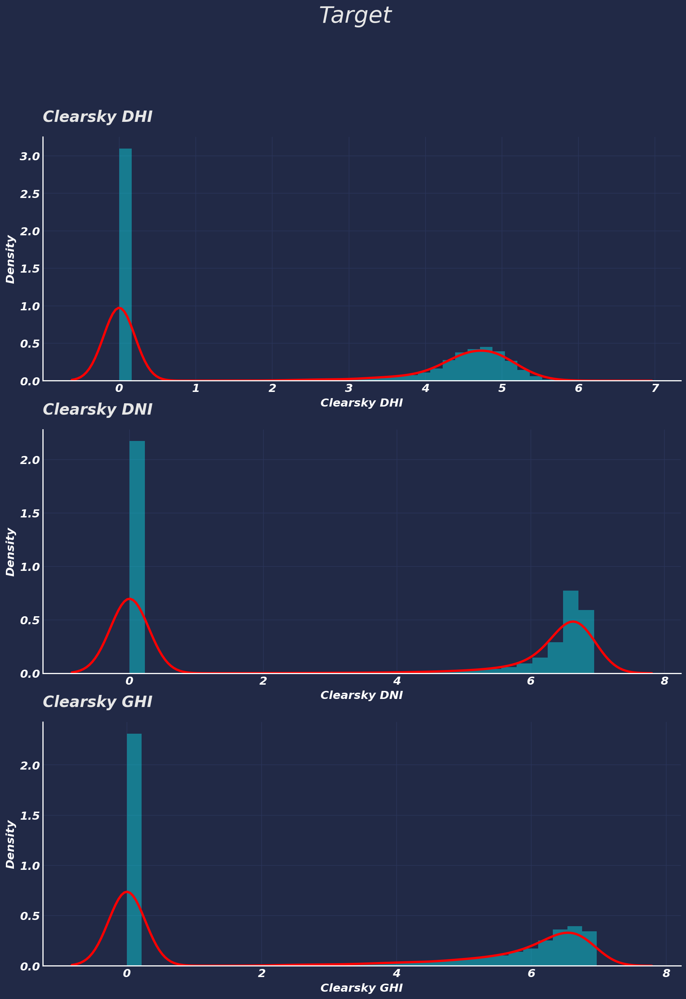

In [15]:
plt.figure(figsize=(15,20))

for i, j in enumerate(target.columns): 
    plt.subplot(3, 1, i+1) 
    
    sns.distplot(np.log1p(train[j]), kde_kws={"linewidth": 3,"color": "red"}) 
    plt.title(j) 
plt.suptitle(" Target", size=30, y= 1) 

In [19]:
# check kemiringan dan kurtosis

for i in target.columns:
    print(i)       
    print(f"skew: {np.log1p(train[i]).skew() }") 
    print(f"Kurt: {np.log1p(train[i]).kurt() }\n") 

Clearsky DHI
skew: 0.1006206155194799
Kurt: -1.9049700585150984

Clearsky DNI
skew: 0.06018481615997799
Kurt: -1.9576249466152262

Clearsky GHI
skew: 0.13985497281059292
Kurt: -1.8791389766119493



In [ ]:
## pisahkan fitur category dan numeric

In [5]:
cater = train.select_dtypes("object").columns
numer = train.select_dtypes("number").drop(target,axis=1).columns

In [7]:
print(f"fitur Category ada: {len(cater)} columns ") 
print(f"fitur Numeric ada: {len(numer)} columns ") 

fitur Category ada: 0 columns 
fitur Numeric ada: 15 columns 


In [ ]:
## Numeric fitur

In [ ]:
# descriptive analysis fitur numeric

In [23]:
train[numer].describe()

,Year,Month,Day,Hour,Minute,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag
count,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000,175296.000000
mean,2013.500274,6.523549,15.727820,11.500000,15.000000,2.540474,13.564431,18.266769,1003.185230,79.376366,89.729463,2.903732,188.877796,2.262871,0.740433
std,2.871908,3.448543,8.799349,6.922206,15.000043,3.021879,8.196787,8.943096,5.935749,19.678235,40.085451,1.546979,99.014733,1.281902,6.575655
min,2009.000000,1.000000,1.000000,0.000000,0.000000,0.000000,-17.000000,-9.000000,970.000000,7.190000,8.550000,0.122000,0.000000,0.000000,0.000000
25%,2011.000000,4.000000,8.000000,5.750000,0.000000,0.000000,8.000000,12.000000,1000.000000,65.590000,56.450000,1.534000,97.400000,1.300000,0.000000
50%,2013.500000,7.000000,16.000000,11.500000,15.000000,1.000000,15.000000,20.000000,1000.000000,84.230000,89.860000,2.866000,200.000000,2.000000,0.000000
75%,2016.000000,10.000000,23.000000,17.250000,30.000000,6.000000,21.000000,25.000000,1010.000000,97.950000,123.060000,4.223000,272.000000,3.000000,0.000000
max,2018.000000,12.000000,31.000000,23.000000,30.000000,10.000000,26.900000,40.000000,1024.000000,100.000000,171.550000,7.700000,360.000000,12.900000,100.000000


In [15]:
train[numer].head()

,Year,Month,Day,Hour,Minute,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag
0,2009,1,1,0,0,0,0.0,5.0,1010,75.34,106.15,0.499,346.1,3.1,0
1,2009,1,1,0,30,0,1.0,5.0,1010,80.81,112.28,0.490,346.1,3.1,0
2,2009,1,1,1,0,4,0.0,5.0,1010,78.27,118.50,0.482,347.9,3.2,0
3,2009,1,1,1,30,4,0.0,4.0,1010,78.27,124.78,0.478,347.9,3.1,0
4,2009,1,1,2,0,4,0.0,4.0,1010,76.45,131.12,0.475,350.0,3.0,0


In [ ]:
# datetime fitur

In [9]:
train.Year.value_counts().sort_index().to_frame() 

,Year
2009,17520
2010,17520
2011,17520
2012,17568
2013,17520
2014,17520
2015,17520
2016,17568
2017,17520
2018,17520


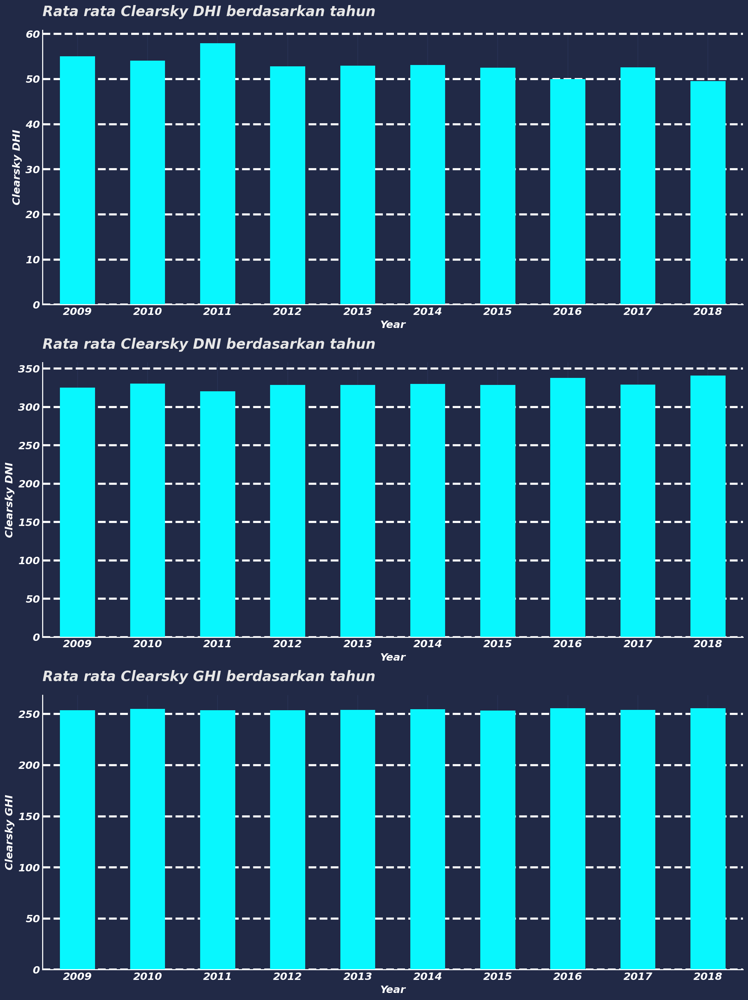

In [40]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    train.groupby("Year")[j].mean().plot(kind="bar")
    plt.grid(axis="y", linewidth=3, linestyle="--", color="white") 
    plt.xticks(rotation=0)
    plt.ylabel(j)
    plt.title(f"Rata rata {j} berdasarkan tahun ") 
plt.tight_layout() 

In [10]:
train.Month.value_counts().sort_index().to_frame() 

,Month
1,14880
2,13536
3,14880
4,14400
5,14880
6,14400
7,14880
8,14880
9,14400
10,14880


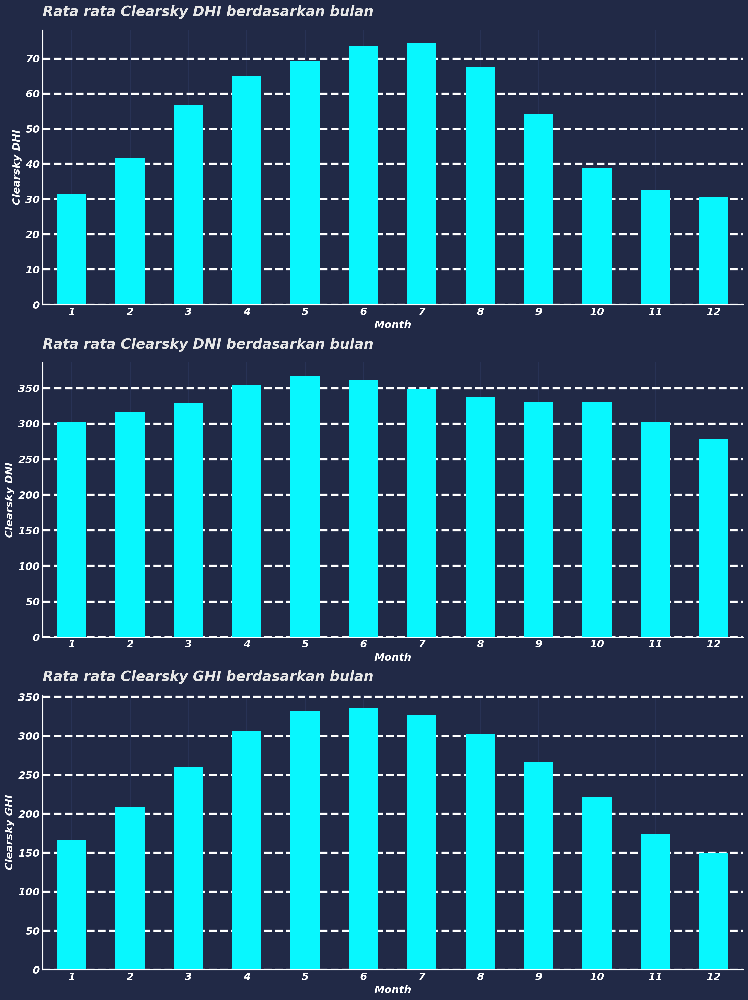

In [41]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    train.groupby("Month")[j].mean().plot(kind="bar")
    plt.grid(axis="y", linewidth=3, linestyle="--", color="white") 
    plt.xticks(rotation=0)
    plt.ylabel(j)
    plt.title(f"Rata rata {j} berdasarkan bulan ") 
plt.tight_layout() 

In [44]:
# check bulan 6 
train.query("Month == 6")[target.columns].describe() 

,Clearsky DHI,Clearsky DNI,Clearsky GHI
count,14400.000000,14400.000000,14400.000000
mean,73.726389,361.719375,335.638889
std,75.054100,352.718917,376.002838
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,65.000000,330.500000,134.000000
75%,138.000000,734.000000,717.000000
max,352.000000,952.000000,1045.000000


In [11]:
train.Day.value_counts().sort_index().to_frame() 

,Day
1,5760
2,5760
3,5760
4,5760
5,5760
6,5760
7,5760
8,5760
9,5760
10,5760


In [13]:
train.Hour.value_counts().sort_index().to_frame() 

,Hour
0,7304
1,7304
2,7304
3,7304
4,7304
5,7304
6,7304
7,7304
8,7304
9,7304


In [14]:
train.Minute.value_counts().sort_index().to_frame() 

,Minute
0,87648
30,87648


In [52]:
# ubah format date ke category 

In [6]:
for i in train.iloc[:,:3]: 
    train[i] = train[i].astype("object") 
    test[i] = test[i].astype("object") 

In [ ]:
# cloud type 

In [59]:
train["Cloud Type"].value_counts()

0     82788
7     23163
3     16255
1     15698
8     14276
4     11738
6      7902
2      3018
9       457
10        1
Name: Cloud Type, dtype: int64

In [61]:
train[train["Cloud Type"] == 10]

,Year,Month,Day,Hour,Minute,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag
113732,2015,6,28,10,0,0,0,0,10,23.0,23.0,1000,100.0,96.71,5.161,279.9,1.6,0


In [ ]:
# hapus cloud type 10

In [7]:
train = train[train["Cloud Type"]!= 10]
train.shape

(175295, 18)

Text(0.0, 1.0, 'Cloud ')

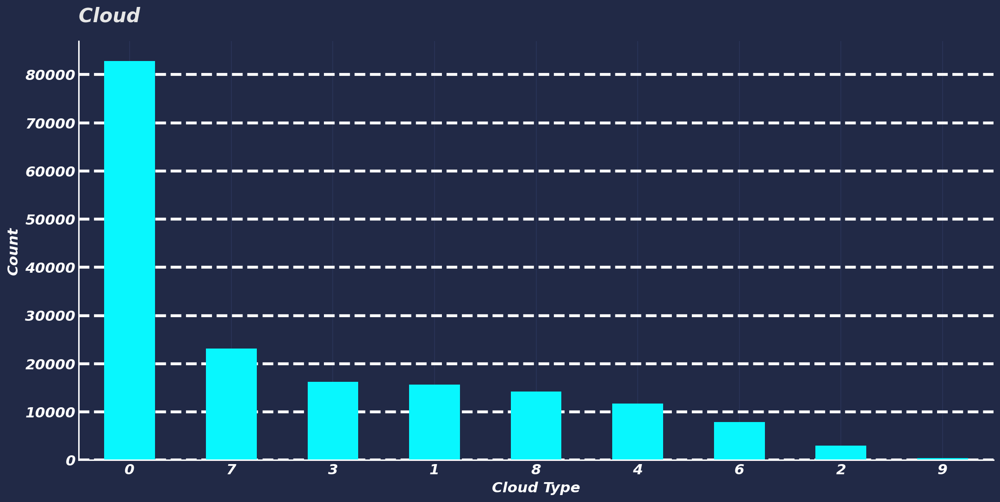

In [71]:
plt.figure(figsize=(17,8))
train["Cloud Type"].value_counts().plot(kind="bar")
plt.grid(axis="y",linewidth=3,linestyle="--",color="white")
plt.xticks(rotation =0)
plt.xlabel("Cloud Type") 
plt.ylabel("Count") 
plt.title("Cloud ") 

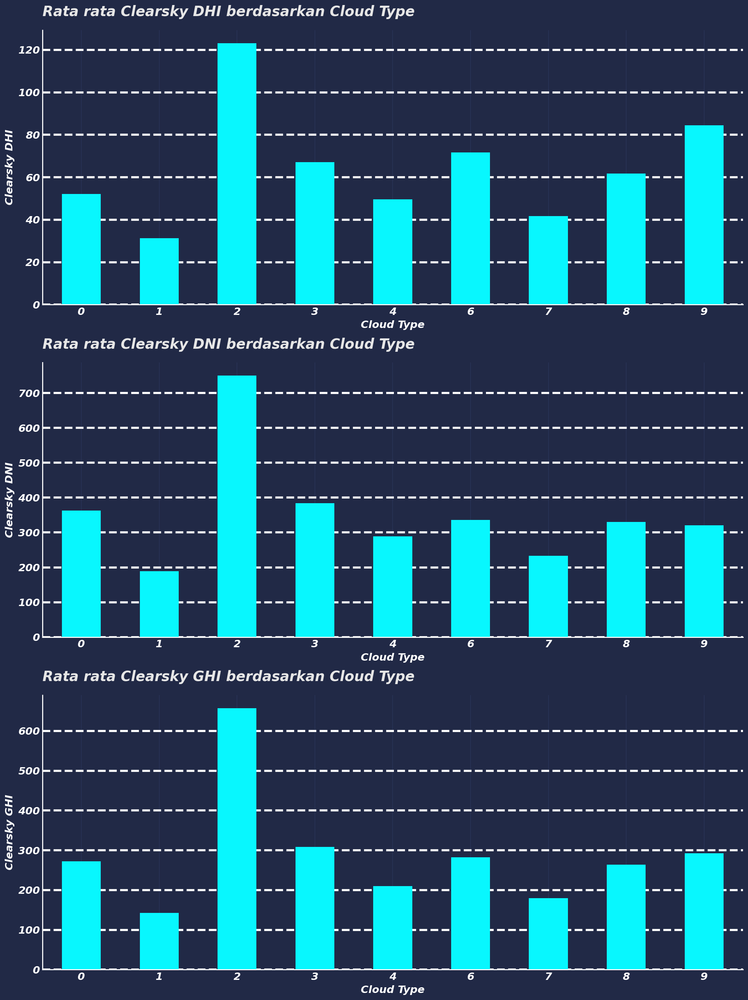

In [72]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    train.groupby("Cloud Type")[j].mean().plot(kind="bar")
    plt.grid(axis="y", linewidth=3, linestyle="--", color="white") 
    plt.xticks(rotation=0)
    plt.ylabel(j)
    plt.title(f"Rata rata {j} berdasarkan Cloud Type ") 
plt.tight_layout() 

In [ ]:
## dew point

In [80]:
train["Dew Point"].sample(10)

28305     24.0
124144     6.0
89666      2.0
134587    20.0
128980    18.0
63790     21.0
15709      9.0
7933      22.0
166810    22.1
34807     -7.0
Name: Dew Point, dtype: float64

Text(0.0, 1.0, 'Dew Point ')

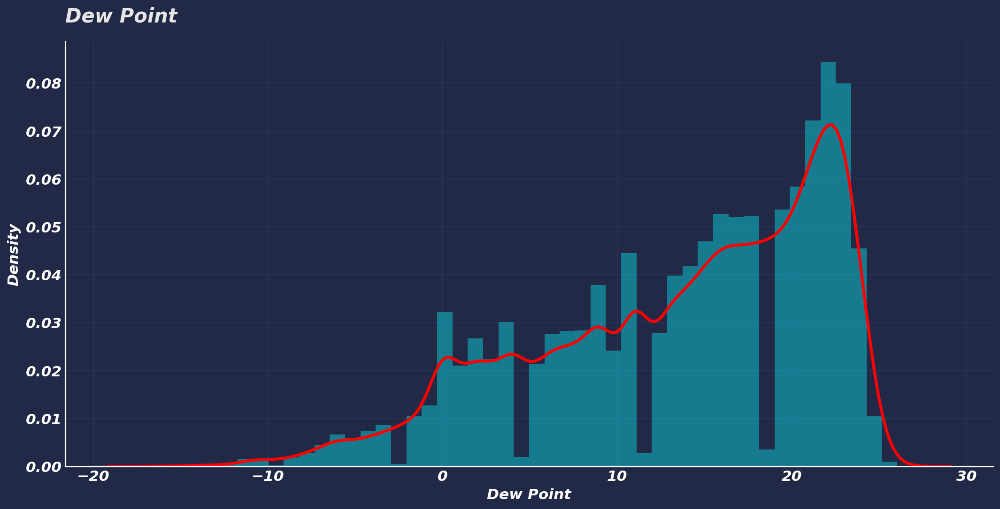

In [83]:
plt.figure(figsize=(17,8))
sns.distplot(train["Dew Point"], kde_kws={"linewidth": 3,"color":"red"}) 
plt.title("Dew Point ") 

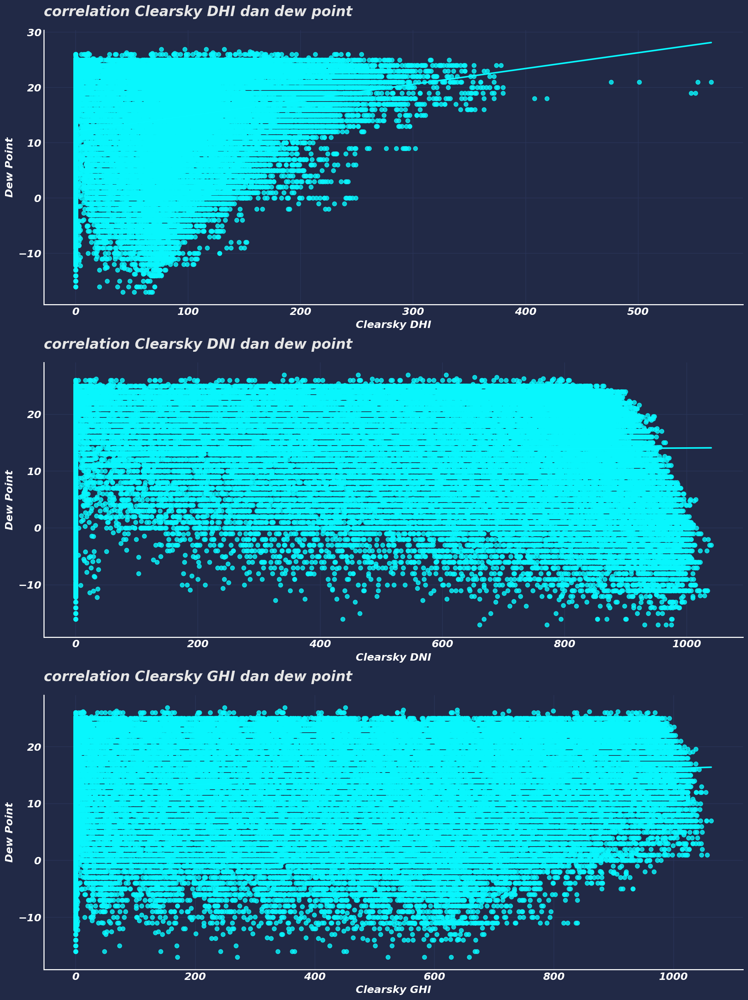

In [86]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    sns.regplot(x = train[j], y=train["Dew Point"], ci=None) 
    plt.title(f"correlation {j} dan dew point ") 
plt.tight_layout() 

In [ ]:
##Temperature

In [87]:
# check temperature terkecil dan terbesar
train.Temperature.nlargest(10)

42902    40.0
42903    40.0
42904    40.0
61282    40.0
61283    40.0
61284    40.0
61285    40.0
61286    40.0
61287    40.0
61288    40.0
Name: Temperature, dtype: float64

In [88]:
# check temperature terkecil dan terbesar
train.Temperature.nsmallest(10)

89064   -9.0
87954   -8.0
87955   -8.0
87956   -8.0
87957   -8.0
87958   -8.0
87959   -8.0
87960   -8.0
89058   -8.0
89059   -8.0
Name: Temperature, dtype: float64

Text(0.0, 1.0, 'Temperature ')

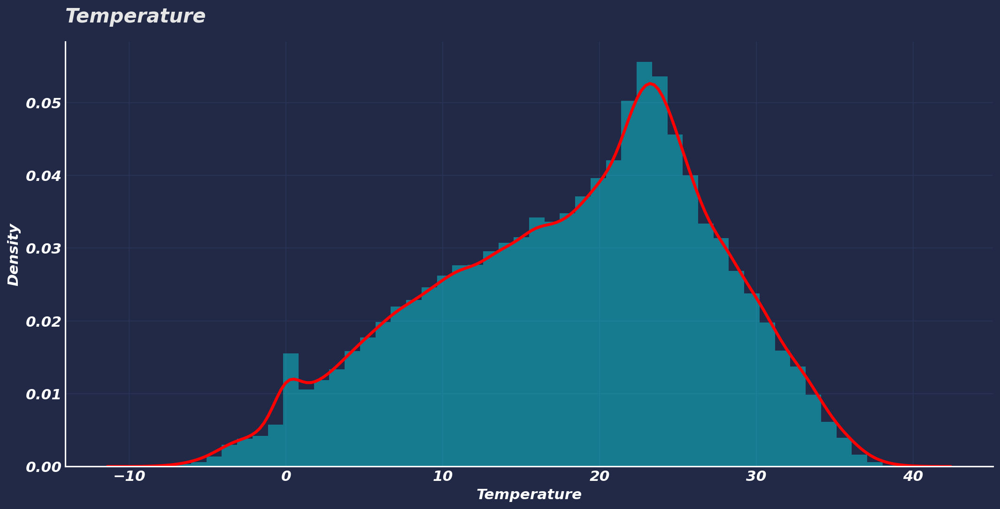

In [89]:
plt.figure(figsize=(17,8))
sns.distplot(train["Temperature"], kde_kws={"linewidth": 3,"color":"red"}) 
plt.title("Temperature ") 

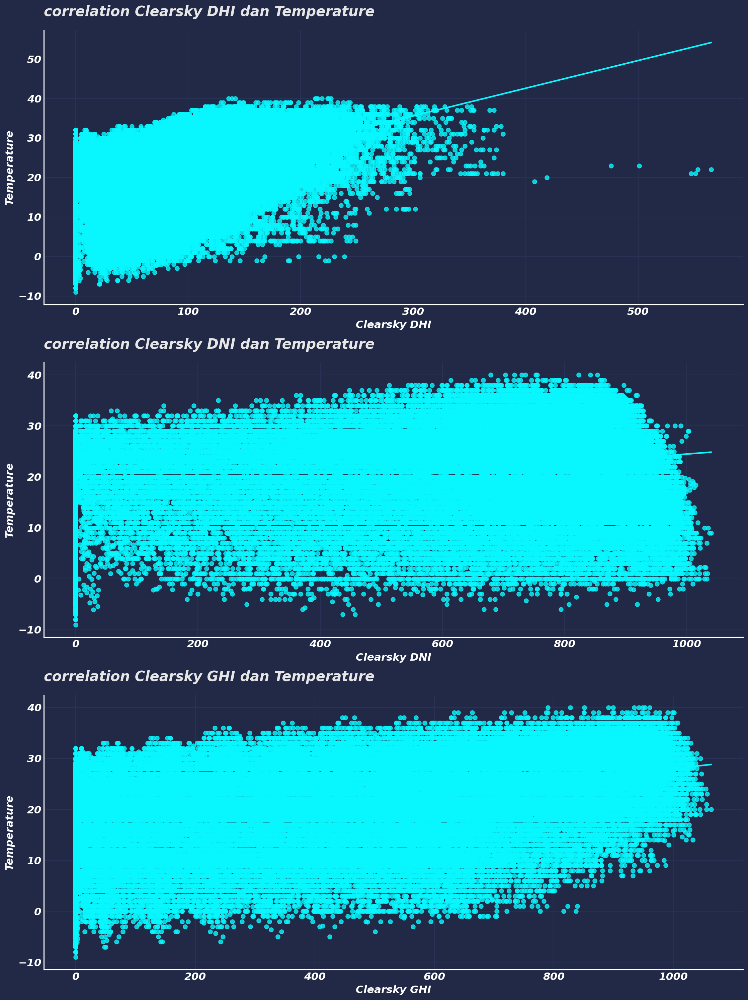

In [90]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    sns.regplot(x = train[j], y=train["Temperature"], ci=None) 
    plt.title(f"correlation {j} dan Temperature ") 
plt.tight_layout() 

In [ ]:
# pressure

In [96]:
# check tekanan terlecil dan terbesar
train.Pressure.value_counts().sort_index().to_frame() 

,Pressure
970,12
976,2
977,2
978,2
979,2
980,121
981,2
982,10
983,7
984,5


Text(0.0, 1.0, 'Pressure ')

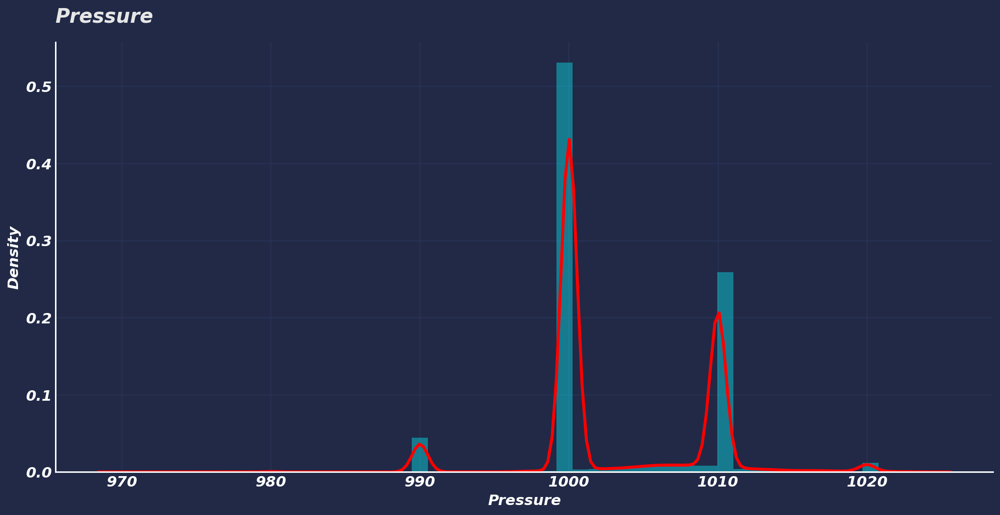

In [97]:
plt.figure(figsize=(17,8))
sns.distplot(train["Pressure"], kde_kws={"linewidth": 3,"color":"red"}) 
plt.title("Pressure ") 

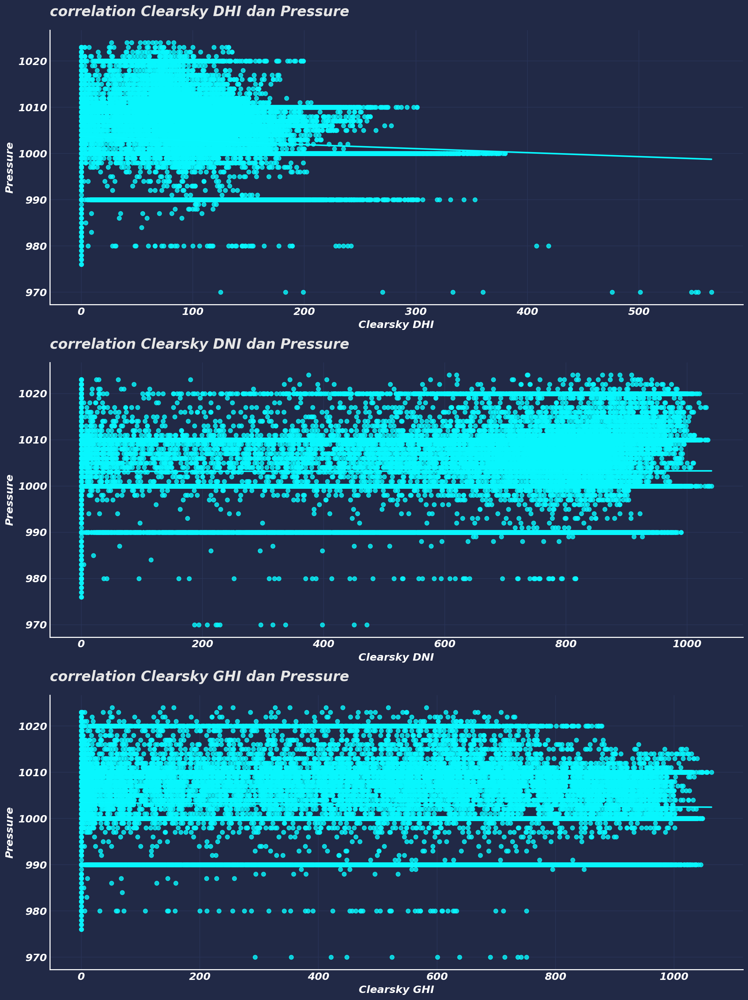

In [98]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    sns.regplot(x = train[j], y=train["Pressure"], ci=None) 
    plt.title(f"correlation {j} dan Pressure ") 
plt.tight_layout() 

In [ ]:
# Relative Humidity 

In [105]:
train["Relative Humidity"].sample(10) 

89697      95.20
1602       82.44
5545       89.33
36156      76.73
65998      58.70
54326      74.22
165213     59.36
98653     100.00
113341     90.95
159199     41.23
Name: Relative Humidity, dtype: float64

Text(0.0, 1.0, 'Relative Humidity ')

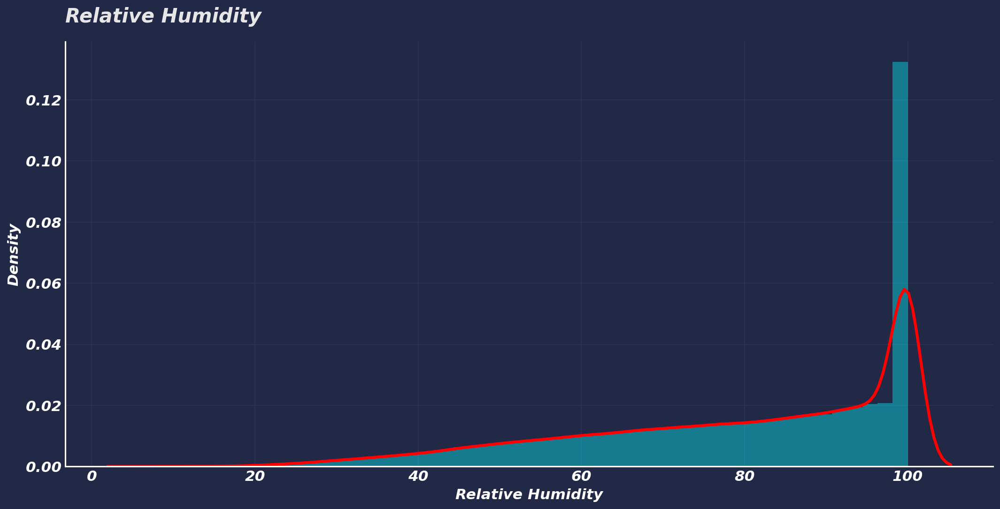

In [106]:
plt.figure(figsize=(17,8))
sns.distplot(train["Relative Humidity"], kde_kws={"linewidth": 3,"color":"red"}) 
plt.title("Relative Humidity ") 

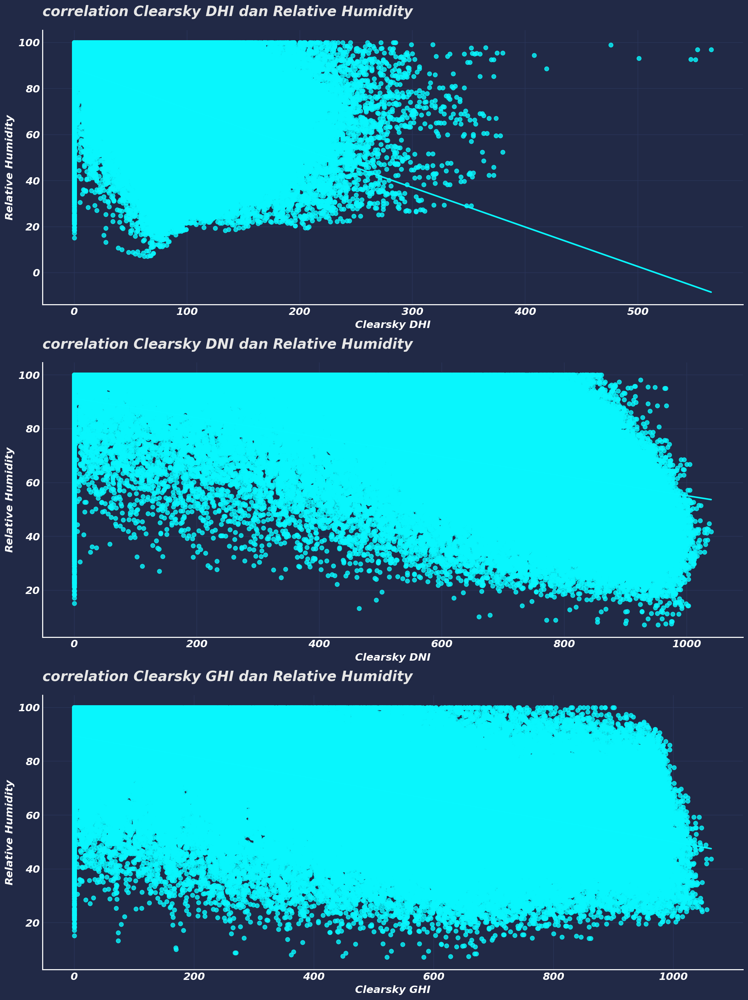

In [10]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    sns.regplot(x = train[j], y=train["Relative Humidity"], ci=None) 
    plt.title(f"correlation {j} dan Relative Humidity ") 
plt.tight_layout() 

In [ ]:
#Solar Zenith Angle

In [17]:
train["Solar Zenith Angle"].sample(10) 

110950     88.80
24835     101.77
3274      150.20
32179     120.71
93005      46.44
20501     127.60
148340     96.27
146616     74.55
30699      66.00
52045     164.89
Name: Solar Zenith Angle, dtype: float64

Text(0.0, 1.0, 'Solar Zenith Angle ')

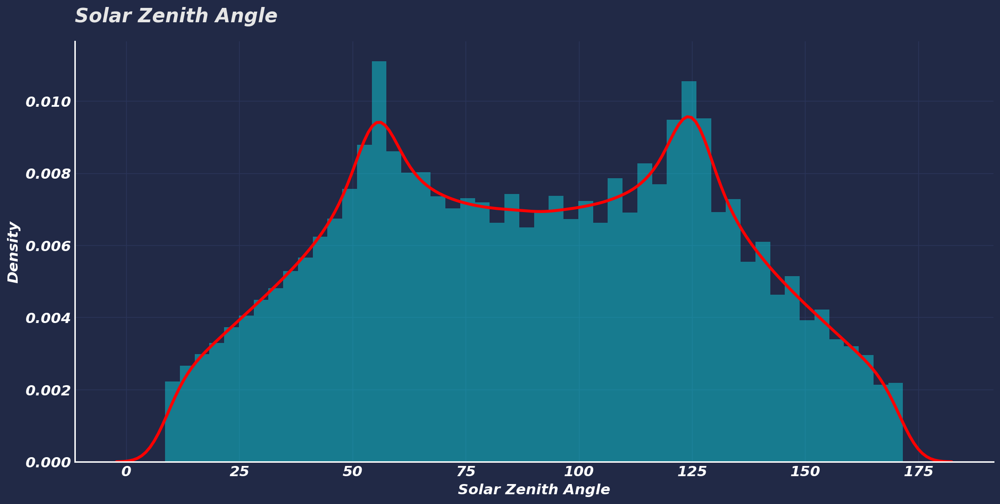

In [19]:
plt.figure(figsize=(17,8))
sns.distplot(train["Solar Zenith Angle"], kde_kws={"linewidth": 3,"color":"red"}) 
plt.title("Solar Zenith Angle ") 

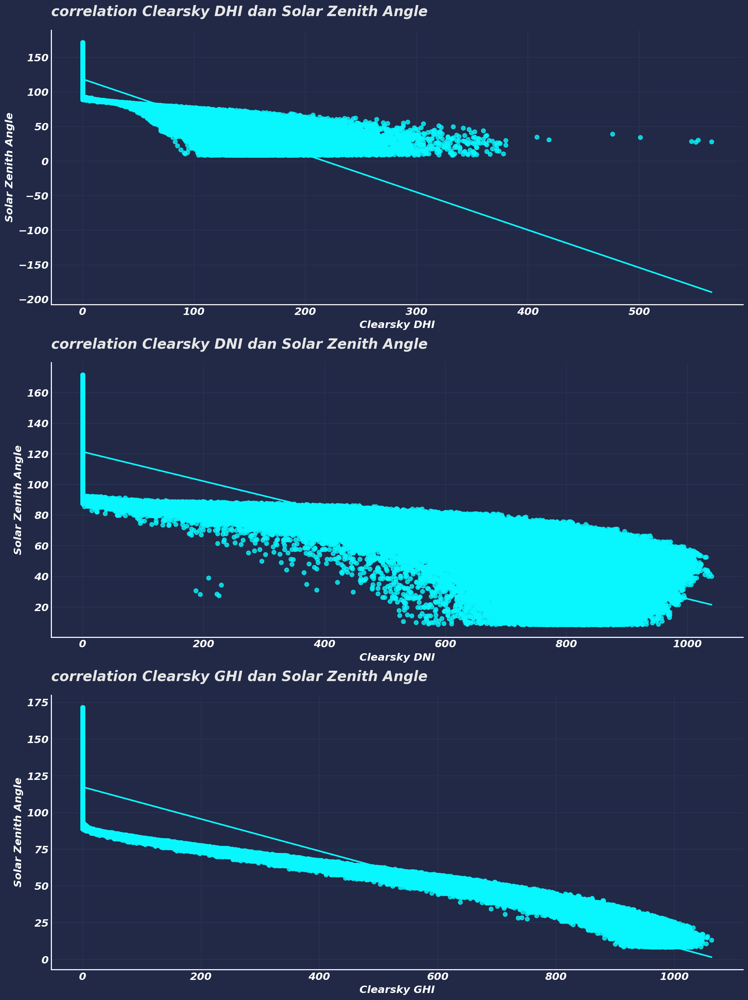

In [20]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    sns.regplot(x = train[j], y=train["Solar Zenith Angle"], ci=None) 
    plt.title(f"correlation {j} dan Solar Zenith Angle ") 
plt.tight_layout() 

In [ ]:
#Precipitable Water /cm

In [ ]:
# check nilai terbesar dan terkecil

In [21]:
train["Precipitable Water"].nlargest(5) 

171362    7.7
171360    7.6
171361    7.6
171363    7.6
171364    7.5
Name: Precipitable Water, dtype: float64

In [23]:
train["Precipitable Water"].nsmallest(5) 

105522    0.122
105521    0.123
105523    0.123
105520    0.124
105524    0.124
Name: Precipitable Water, dtype: float64

Text(0.0, 1.0, 'Precipitable Water')

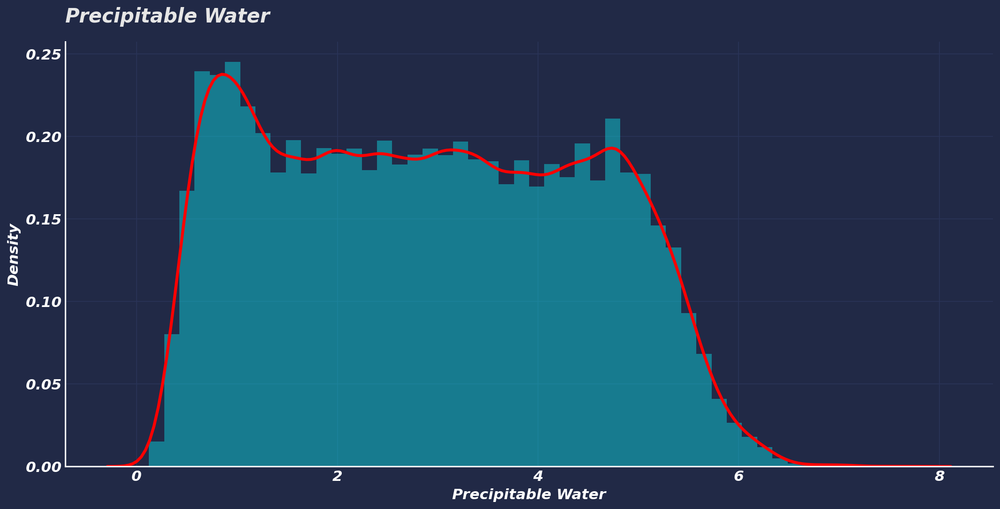

In [24]:
plt.figure(figsize=(17,8))
sns.distplot(train["Precipitable Water"], kde_kws={"linewidth": 3,"color":"red"}) 
plt.title("Precipitable Water") 

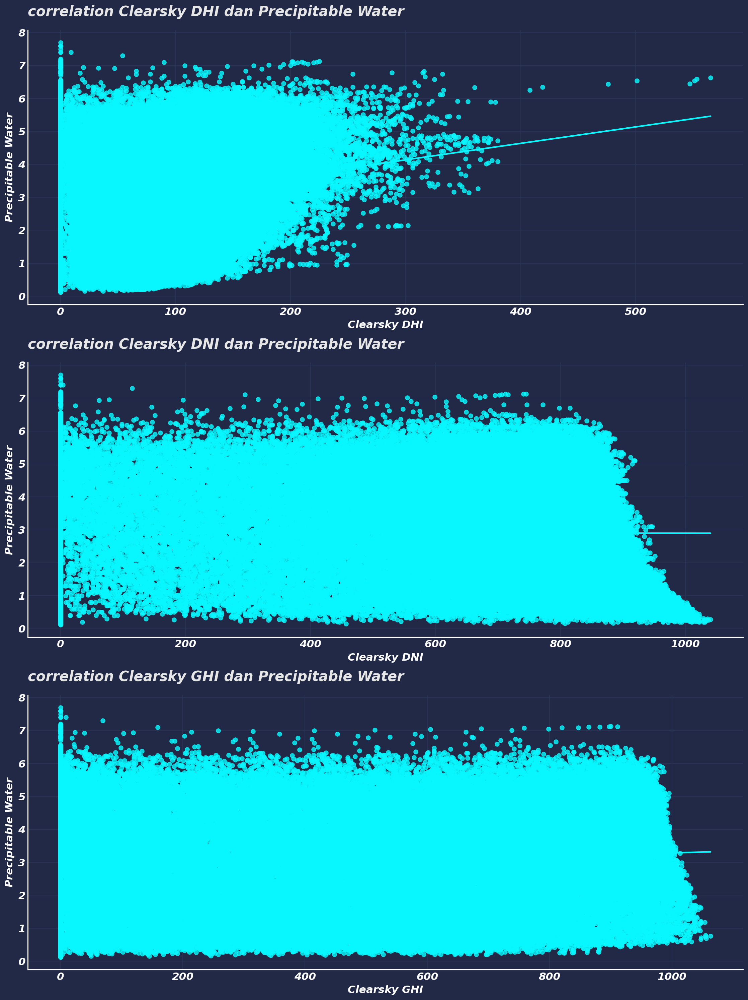

In [25]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    sns.regplot(x = train[j], y=train["Precipitable Water"], ci=None) 
    plt.title(f"correlation {j} dan Precipitable Water ") 
plt.tight_layout() 

In [ ]:
# Wind feature

In [26]:
train["Wind Direction"].sample(10) 

115481    344.9
142803     60.7
58608     263.0
45689     317.7
50305     178.7
101829     43.8
72474     153.3
27356     153.8
7697      313.9
150624    197.5
Name: Wind Direction, dtype: float64

In [ ]:
# check yang terbesar dan terkecil 


In [27]:
train["Wind Direction"].nsmallest(10) 

66050     0.0
66051     0.0
158956    0.0
160727    0.0
160728    0.0
160729    0.0
160730    0.0
161016    0.0
162306    0.0
170156    0.0
Name: Wind Direction, dtype: float64

In [28]:
train["Wind Direction"].nlargest(10) 

19366     360.0
19367     360.0
35156     360.0
35157     360.0
67326     360.0
67327     360.0
87318     360.0
87319     360.0
121514    360.0
121515    360.0
Name: Wind Direction, dtype: float64

Text(0.0, 1.0, 'Wind Direction')

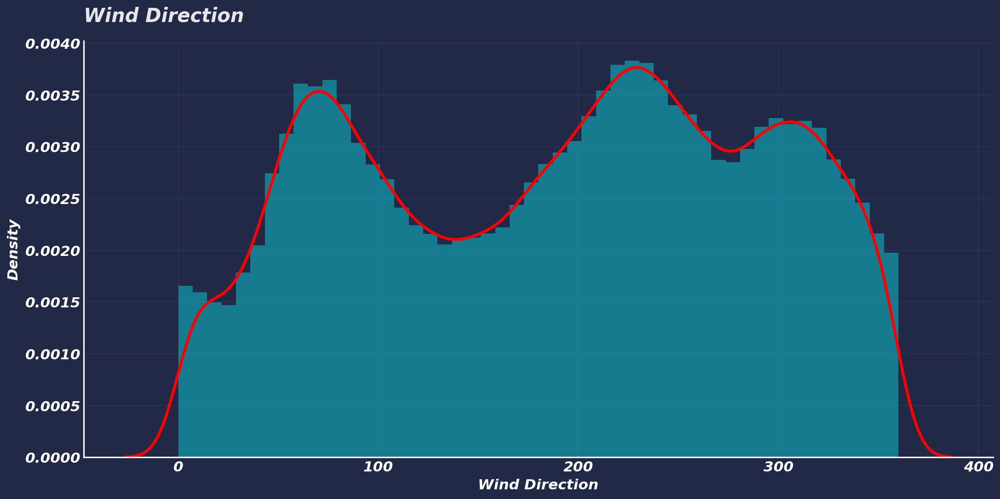

In [29]:
plt.figure(figsize=(17,8))
sns.distplot(train["Wind Direction"], kde_kws={"linewidth": 3,"color":"red"}) 
plt.title("Wind Direction") 

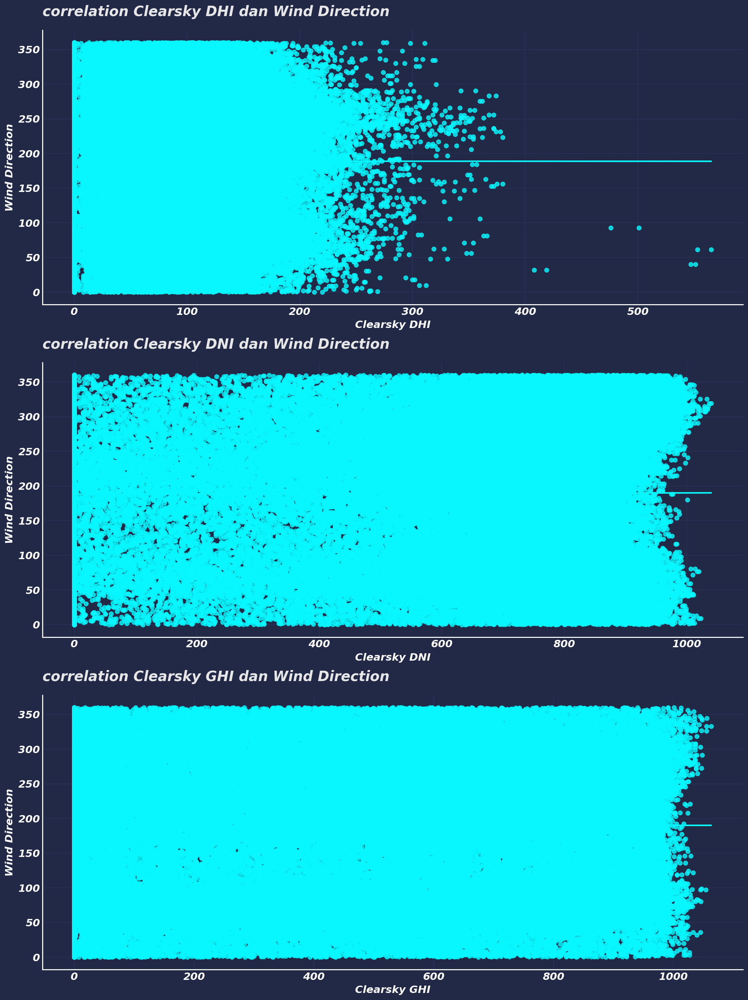

In [30]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    sns.regplot(x = train[j], y=train["Wind Direction"], ci=None) 
    plt.title(f"correlation {j} dan Wind Direction ") 
plt.tight_layout() 

In [ ]:
# m/s

In [31]:
train["Wind Speed"].nlargest(10)

152430    12.9
152429    12.8
152428    12.7
152427    12.6
152426    12.5
152431    12.4
152432    12.0
152425    11.9
152424    11.3
152433    11.2
Name: Wind Speed, dtype: float64

In [32]:
train["Wind Speed"].nsmallest(10)

70372     0.0
82538     0.0
105884    0.0
105885    0.0
146693    0.0
146694    0.0
146695    0.0
1194      0.1
9682      0.1
9683      0.1
Name: Wind Speed, dtype: float64

Text(0.0, 1.0, 'Wind Speed')

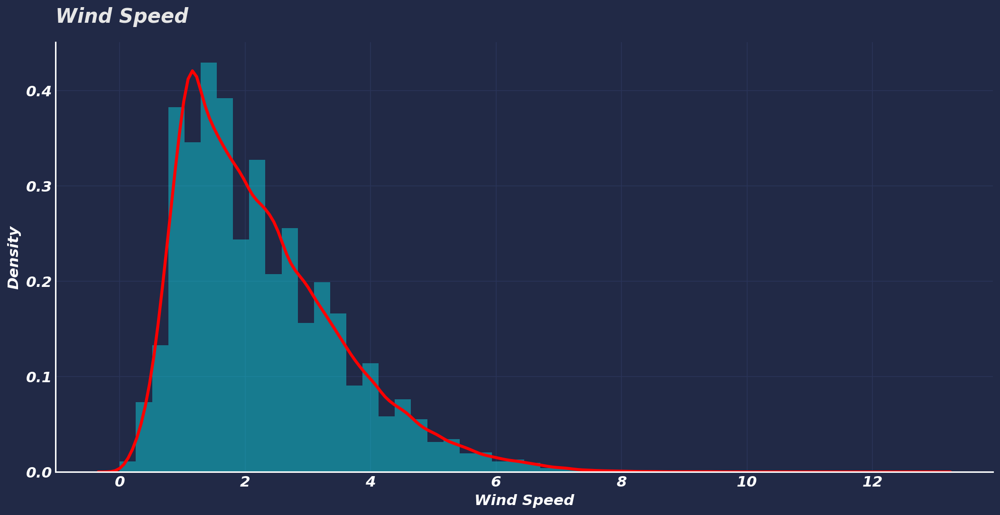

In [33]:
plt.figure(figsize=(17,8))
sns.distplot(train["Wind Speed"], kde_kws={"linewidth": 3,"color":"red"}) 
plt.title("Wind Speed") 

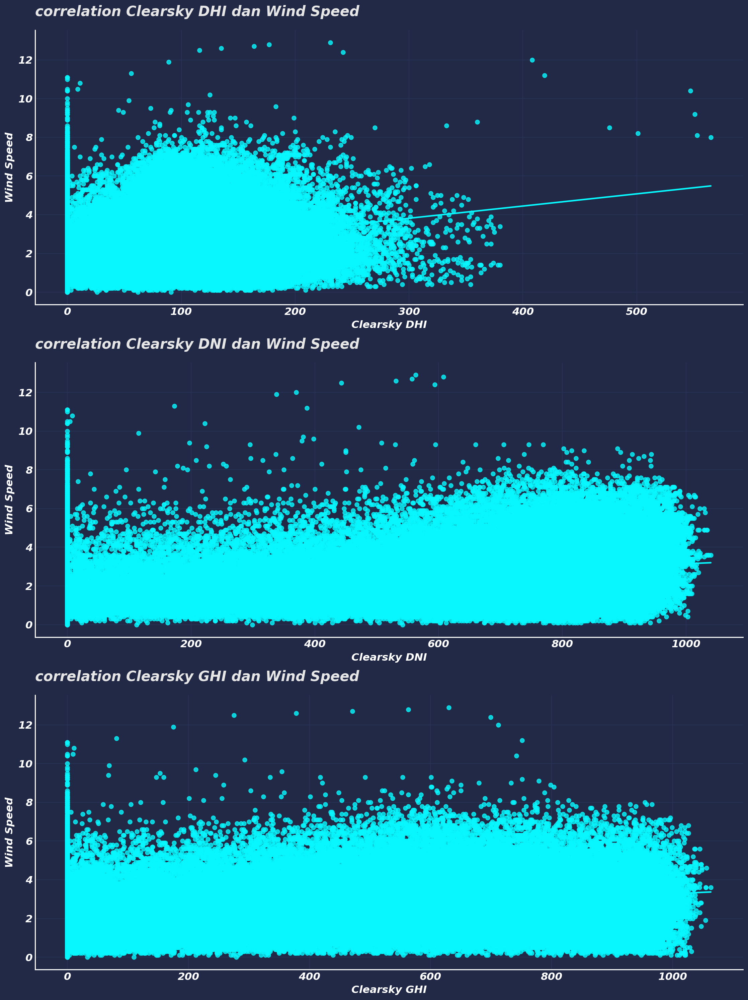

In [38]:
plt.figure(figsize=(15, 20)) 
for i,j in enumerate(target.columns):
    plt.subplot(3, 1, i+1) 
    sns.regplot(x = train[j], y=train["Wind Speed"], ci=None) 
    plt.title(f"correlation {j} dan Wind Speed ") 
plt.tight_layout()

In [ ]:
# fill flag

In [40]:
train["Fill Flag"].value_counts(). sort_index().to_frame() 

,Fill Flag
0,164284
1,2046
3,290
4,6864
7,93
11,60
14,204
18,46
21,34
25,48


In [ ]:
#check rata target berdasarkan nilai fill flag di table

In [46]:
train.groupby("Fill Flag")["Clearsky DHI"].mean().to_frame().style.bar("Clearsky DHI", color="red") 

,Clearsky DHI
Fill Flag,
0,52.854892
1,15.982405
3,99.500000
4,66.966638
7,83.838710
11,83.633333
14,48.857843
18,69.673913
21,65.500000


In [47]:
train.groupby("Fill Flag")["Clearsky DNI"].mean().to_frame().style.bar("Clearsky DNI", color="red") 

,Clearsky DNI
Fill Flag,
0,329.562970
1,116.258553
3,411.617241
4,391.336538
7,565.634409
11,546.533333
14,336.500000
18,507.413043
21,423.676471


In [48]:
train.groupby("Fill Flag")["Clearsky GHI"].mean().to_frame().style.bar("Clearsky GHI", color="red") 

,Clearsky GHI
Fill Flag,
0,257.832199
1,83.853861
3,245.120690
4,241.029720
7,395.709677
11,377.466667
14,191.348039
18,305.500000
21,210.558824


In [ ]:
# feature engineering

In [50]:
train

,Year,Month,Day,Hour,Minute,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag
0,2009,1,1,0,0,0,0,0,0,0.0,5.0,1010,75.34,106.15,0.499,346.1,3.1,0
1,2009,1,1,0,30,0,0,0,0,1.0,5.0,1010,80.81,112.28,0.490,346.1,3.1,0
2,2009,1,1,1,0,0,0,0,4,0.0,5.0,1010,78.27,118.50,0.482,347.9,3.2,0
3,2009,1,1,1,30,0,0,0,4,0.0,4.0,1010,78.27,124.78,0.478,347.9,3.1,0
4,2009,1,1,2,0,0,0,0,4,0.0,4.0,1010,76.45,131.12,0.475,350.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175291,2018,12,31,21,30,51,555,168,4,19.4,20.8,1008,91.77,77.86,3.700,204.0,3.5,100
175292,2018,12,31,22,0,37,388,84,4,19.1,20.1,1008,93.88,83.03,3.800,209.0,3.2,100
175293,2018,12,31,22,30,15,115,18,7,19.1,19.6,1008,96.83,88.32,3.800,208.0,2.6,57
175294,2018,12,31,23,0,0,0,0,7,18.7,19.2,1009,96.84,94.34,3.700,206.0,2.1,0


In [ ]:
# ubah ke format datetime 

In [17]:
for i in [train,test]:
    i["date"] = pd.to_datetime(i.iloc[:,:5]) 

In [21]:
# rata rata temperature berdasatkan tahun dan bulan dan hari
for i in [train, test]: 
    i["new"] = i.groupby(date.dt.strftime("%Y-%m-%d"))["Temperature"].transform("mean") 

In [23]:
# rata rata wind speed berdasatkan tahun dan bulan dan hari
for i in [train, test]: 
    i["new_1"] = i.groupby(date.dt.strftime("%Y-%m-%d"))["Wind Speed"].transform("mean") 

In [24]:
train

,Year,Month,Day,Hour,Minute,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag,date,new,new_1
0,2009,1,1,0,0,0,0,0,0,0.0,5.0,1010,75.34,106.15,0.499,346.1,3.1,0,2009-01-01 00:00:00,3.37500,2.862500
1,2009,1,1,0,30,0,0,0,0,1.0,5.0,1010,80.81,112.28,0.490,346.1,3.1,0,2009-01-01 00:30:00,3.37500,2.862500
2,2009,1,1,1,0,0,0,0,4,0.0,5.0,1010,78.27,118.50,0.482,347.9,3.2,0,2009-01-01 01:00:00,3.37500,2.862500
3,2009,1,1,1,30,0,0,0,4,0.0,4.0,1010,78.27,124.78,0.478,347.9,3.1,0,2009-01-01 01:30:00,3.37500,2.862500
4,2009,1,1,2,0,0,0,0,4,0.0,4.0,1010,76.45,131.12,0.475,350.0,3.0,0,2009-01-01 02:00:00,3.37500,2.862500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175291,2018,12,31,21,30,51,555,168,4,19.4,20.8,1008,91.77,77.86,3.700,204.0,3.5,100,2018-12-31 21:30:00,18.83125,2.764583
175292,2018,12,31,22,0,37,388,84,4,19.1,20.1,1008,93.88,83.03,3.800,209.0,3.2,100,2018-12-31 22:00:00,18.83125,2.764583
175293,2018,12,31,22,30,15,115,18,7,19.1,19.6,1008,96.83,88.32,3.800,208.0,2.6,57,2018-12-31 22:30:00,18.83125,2.764583
175294,2018,12,31,23,0,0,0,0,7,18.7,19.2,1009,96.84,94.34,3.700,206.0,2.1,0,2018-12-31 23:00:00,18.83125,2.764583


In [25]:
for i in [train,test]:
    i.drop("date", axis=1, inplace=True) 

In [26]:
train

,Year,Month,Day,Hour,Minute,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,Dew Point,Temperature,Pressure,Relative Humidity,Solar Zenith Angle,Precipitable Water,Wind Direction,Wind Speed,Fill Flag,new,new_1
0,2009,1,1,0,0,0,0,0,0,0.0,5.0,1010,75.34,106.15,0.499,346.1,3.1,0,3.37500,2.862500
1,2009,1,1,0,30,0,0,0,0,1.0,5.0,1010,80.81,112.28,0.490,346.1,3.1,0,3.37500,2.862500
2,2009,1,1,1,0,0,0,0,4,0.0,5.0,1010,78.27,118.50,0.482,347.9,3.2,0,3.37500,2.862500
3,2009,1,1,1,30,0,0,0,4,0.0,4.0,1010,78.27,124.78,0.478,347.9,3.1,0,3.37500,2.862500
4,2009,1,1,2,0,0,0,0,4,0.0,4.0,1010,76.45,131.12,0.475,350.0,3.0,0,3.37500,2.862500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175291,2018,12,31,21,30,51,555,168,4,19.4,20.8,1008,91.77,77.86,3.700,204.0,3.5,100,18.83125,2.764583
175292,2018,12,31,22,0,37,388,84,4,19.1,20.1,1008,93.88,83.03,3.800,209.0,3.2,100,18.83125,2.764583
175293,2018,12,31,22,30,15,115,18,7,19.1,19.6,1008,96.83,88.32,3.800,208.0,2.6,57,18.83125,2.764583
175294,2018,12,31,23,0,0,0,0,7,18.7,19.2,1009,96.84,94.34,3.700,206.0,2.1,0,18.83125,2.764583


In [ ]:
# buat file baru 

In [31]:
test.drop(target.columns, axis=1, inplace=True) 

In [28]:
print(train.isnull().any().sum())
print(train.duplicated().sum()) 

0
0


In [32]:
print(train.shape)
print(test.shape)

(175295, 20)
(17520, 17)


In [33]:
train.to_csv("train_energy(clean).csv",index=False)
test.to_csv("test_energy(clean).csv",index=False)